# Import libraries and set global variables

In [1]:
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')

from utils import *
from gages_utils import load_gages_dataset

#from find_optimal_dimension import wrapper as optimal_dimension
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

import json
import os.path

from scipy.stats import spearmanr, shapiro

from sklearn.decomposition import PCA

# Libraries for K-means and Hierarchical Clustering
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from sklearn.cluster import KMeans

# GAGES-II variables not te used for similarity
NOT_FOR_SIM = ['STAID', 'HUC02','LAT_GAGE','LNG_GAGE','STATE', 'CLASS']

%matplotlib inline

# Load GAGES II dataset

In [2]:
df, cols_for_similarity = load_gages_dataset(do_process_raw_columns=True)
df

,STAID,DRAIN_SQKM,HUC02,LAT_GAGE,LNG_GAGE,STATE,CLASS,HYDRO_DISTURB_INDX,BAS_COMPACTNESS,PPTAVG_BASIN,...,ELEV_MAX_M_BASIN,ELEV_MIN_M_BASIN,ELEV_MEDIAN_M_BASIN,ELEV_STD_M_BASIN,ELEV_SITE_M,RRMEAN,RRMEDIAN,SLOPE_PCT,ASPECT_NORTHNESS,ASPECT_EASTNESS
0,01011000,3186.8,01,47.069611,-69.079544,ME,Non-ref,8,1.29,96.73,...,634,186,364,58.8,187,0.395,0.397,5.9,-0.971,-0.241
1,01013500,2252.7,01,47.237394,-68.582642,ME,Ref,5,0.87,97.42,...,604,157,253,81.8,157,0.260,0.215,6.9,-0.642,0.767
2,01015800,2313.8,01,46.523003,-68.371764,ME,Non-ref,4,0.91,100.67,...,729,164,261,68.7,166,0.202,0.172,4.6,-0.460,0.888
3,01016500,847.8,01,46.628311,-68.434792,ME,Non-ref,4,1.11,100.18,...,651,165,317,79.4,165,0.328,0.313,6.8,-0.391,0.920
4,01017000,4278.9,01,46.777294,-68.157194,ME,Non-ref,5,0.96,99.68,...,729,130,253,73.8,131,0.237,0.205,4.8,-0.503,0.864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9062,394308105413800,207.6,10L,39.718876,-105.694448,CO,Non-ref,13,2.43,68.11,...,4344,2580,3533,289.4,2580,0.519,0.540,39.0,0.329,0.944
9063,394839104570300,477.5,10L,39.811080,-104.951670,CO,Non-ref,31,1.40,47.44,...,2051,1562,1751,99.9,1561,0.409,0.387,2.7,0.965,-0.263
9064,401733105392404,7.0,10L,40.293056,-105.654444,CO,Non-ref,12,3.63,125.05,...,4005,3104,3506,213.5,3115,0.444,0.446,59.9,0.871,0.491
9065,402114105350101,104.8,10L,40.353873,-105.584168,CO,Ref,6,2.00,94.40,...,3918,2442,3301,367.8,2444,0.537,0.582,38.9,-0.038,0.999


# Run this cell for the CONUS analysis

In [3]:
#The only free parameters of the entire workflow
k=20

alpha_attr = 0.21627185237270202
alpha_gauges = 0.1548816618912481

# Use this value of alpha_gauges for coarser clusters
#alpha_gauges = 0.18

# Use this value of alpha_gauges for finer clusters
#alpha_gauges = 0.14621771744567183

traits_categories_labels = ["Developed Areas", "Precipitation and Runoff", "Temperature", "Croplands", "Croplands and Canals",
"Croplands and Dams", "Barren Soil and\nDeciduous Forests", "Elevation", "Evergreen Forests", "Woody Wetlands and\nCroplands", "Lakes, Ponds\nand Reservoirs",
"Pastures and\nGrasslands", "Fine Soils", "Major Dams", "Summer Precipitation", "Herbaceous Wetlands",
"Mixed Forests", "Coarse Soils", "Perennial Ice and Snow", "Shrublands", "Lower Order Streams", "Higher Order Streams",
"Non Croplands", "Overland Flow", "Bulk Density"]

scale = "CONUS"

# Run this cell for the Upper Colorado River Basin analysis

In [ ]:
df = df[df["HUC02"]=='14']

#The only free parameters of the entire workflow
k=16

alpha_attr = 0.203
alpha_gauges = 0.167

traits_categories_labels = ['Temperature', 'Developed Areas', 'Precipitation', 'Cultivated Areas', 'Pasture', 'Urban Areas',
'Reservoirs', 'Major Dams', 'Evergreen Forest', 'Wetlands', 'Decidous Forest', 'Mixed Forest',
'Precipitation\n(aggregate measures)', 'Fine Soil', 'Barren Soil', 'Elevation/Sandy Soil', 'Shrubland',
'Grassland', 'Perennial Ice', 'Elevation/Precipitation', 'Spring Precipitation', 'Proximity to Dams',
'Major Streams', 'Idle Crops', 'Summer Precipitation', 'Disturbed Basin',
'Other Lands', 'First Order Streams', 'Annual Runoff', 'Sunflowers', 'Water Table Depth']

scale = "HUC14"

# Remove zero variance variables

In [4]:
df_cols_for_similarity = df[cols_for_similarity]
df_std = np.std(df_cols_for_similarity.values, axis=0)
zero_std_cols = df_cols_for_similarity.columns.values[(np.isnan(df_std)) | (df_std==0)]
df.drop(columns=zero_std_cols, inplace=True)
df_cols_for_similarity.drop(columns=zero_std_cols, inplace=True)
cols_for_similarity=[x for x in cols_for_similarity if x not in zero_std_cols]
df[cols_for_similarity]

,DRAIN_SQKM,HYDRO_DISTURB_INDX,BAS_COMPACTNESS,PPTAVG_BASIN,PPTAVG_SITE,T_AVG_BASIN,T_AVG_SITE,T_MAX_BASIN,T_MAXSTD_BASIN,T_MAX_SITE,...,ELEV_MAX_M_BASIN,ELEV_MIN_M_BASIN,ELEV_MEDIAN_M_BASIN,ELEV_STD_M_BASIN,ELEV_SITE_M,RRMEAN,RRMEDIAN,SLOPE_PCT,ASPECT_NORTHNESS,ASPECT_EASTNESS
0,3186.8,8,1.29,96.73,90.09,3.32,3.3,9.56,0.156,9.7,...,634,186,364,58.8,187,0.395,0.397,5.9,-0.971,-0.241
1,2252.7,5,0.87,97.42,93.53,3.00,3.0,9.67,0.202,10.0,...,604,157,253,81.8,157,0.260,0.215,6.9,-0.642,0.767
2,2313.8,4,0.91,100.67,95.13,3.33,2.9,9.69,0.242,10.0,...,729,164,261,68.7,166,0.202,0.172,4.6,-0.460,0.888
3,847.8,4,1.11,100.18,95.84,3.05,3.1,9.59,0.194,9.9,...,651,165,317,79.4,165,0.328,0.313,6.8,-0.391,0.920
4,4278.9,5,0.96,99.68,97.16,3.27,3.9,9.68,0.224,10.2,...,729,130,253,73.8,131,0.237,0.205,4.8,-0.503,0.864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9062,207.6,13,2.43,68.11,45.45,0.69,2.3,5.72,1.935,12.2,...,4344,2580,3533,289.4,2580,0.519,0.540,39.0,0.329,0.944
9063,477.5,31,1.40,47.44,37.08,9.50,10.7,17.46,0.290,18.4,...,2051,1562,1751,99.9,1561,0.409,0.387,2.7,0.965,-0.263
9064,7.0,12,3.63,125.05,110.40,0.54,1.3,4.17,1.343,6.8,...,4005,3104,3506,213.5,3115,0.444,0.446,59.9,0.871,0.491
9065,104.8,6,2.00,94.40,49.11,1.06,4.6,6.31,2.478,11.8,...,3918,2442,3301,367.8,2444,0.537,0.582,38.9,-0.038,0.999


# Save the preprocessed dataset as csv

In [5]:
df[["STAID"]+cols_for_similarity].to_csv("preprocessed_dataset_%s.csv" % scale, index=False)

# Correlation tests

In [6]:
# Shapiro normality test
shapiro_test = [shapiro(df_cols_for_similarity[col].values)[1]>0.05 for col in df_cols_for_similarity.columns]
normality_ratio = np.sum(shapiro_test)/len(df_cols_for_similarity.columns)
print("Shapiro Normality Test ratio:", normality_ratio)

# Spearman Correlation Coefficient
sp_r, sp_p = spearmanr(df_cols_for_similarity.values)
sp_corr_ratio = np.sum(sp_p[np.triu_indices(sp_p.shape[0], k=1)]<0.05)/(sp_p.shape[0]*(sp_p.shape[0]-1)/2.) # 0.91
print("Spearman Correlation ratio:", sp_corr_ratio)

# Pearson Correlation Coefficient
pea_r, pea_p = corrcoef(df_cols_for_similarity.values.T)
pea_corr_ratio = np.sum(pea_p[np.triu_indices(pea_p.shape[0], k=1)]<0.05)/(pea_p.shape[0]*(pea_p.shape[0]-1)/2.) # 0.89
print("Pearson Correlation ratio:", pea_corr_ratio)

Shapiro Normality Test ratio: 0.0
Spearman Correlation ratio: 0.9212587898719286
Pearson Correlation ratio: 0.8382663565145317


# Standardize dataset and create matrix

In [7]:
df_standardized = standardize_df(df_cols_for_similarity)
M = df_standardized.values

# PCA

Retained information after PCA: 0.715840862693693


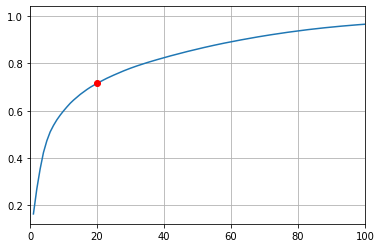

In [8]:
U, S, VT = np.linalg.svd(M, full_matrices=True)

M_transf = U[:,:k].dot(np.diag(S[:k]))
PCs = VT[:k, :].T

S2 = S**2
print("Retained information after PCA:", (np.cumsum(S2)/np.sum(S2))[k-1])
fig, ax = plt.subplots()
S2_norm_cumsum = np.cumsum(S2)/np.sum(S2)
ax.plot(np.arange(len(S2_norm_cumsum))+1,S2_norm_cumsum, '-')
ax.set_xlim([0,100])
ax.scatter([k], S2_norm_cumsum[k-1], c='r', zorder=10)
plt.grid(True)

# Make pairwise similarity

In [9]:
attr_similarity = make_cosine_similarity(PCs)
gauges_similarity = make_cosine_similarity(M_transf)

# Generate traits network and clustering

Traits Network
Number of nodes: 274
Number of edges: 1422


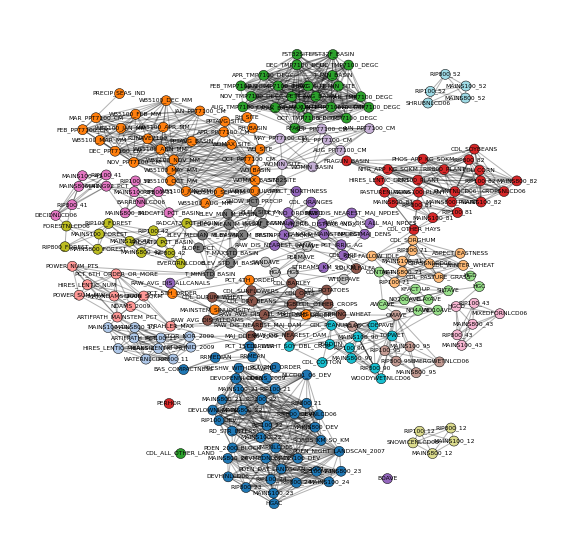

In [10]:
G_V = make_backbone_network(attr_similarity, cols_for_similarity, alpha = alpha_attr, reciprocated=False)

print("Traits Network")
print("Number of nodes:", len(G_V.nodes()))
print("Number of edges:", len(G_V.edges()))

_, communities_attr, communities_attr_to_nodes_dict = make_community(G_V, return_inv=True)

quantities = [{"name":"communities", "values":communities_attr, "discrete":True}]
plot_network(G_V, quantities, nodesize=None, suffix='traits_%s' % scale)

# Print traits categories based on clusters of traits

In [11]:
nodes_by_degree= sorted(nx.degree_centrality(G_V).items(), key=lambda item: item[1], reverse=True)
nodes_by_degree = [(x[0], int(np.round(x[1]*(len(G_V.nodes)-1)))) for x in nodes_by_degree]
for i,j in communities_attr_to_nodes_dict.items():
    print("Cluster ID: %d, \t Assigned Name: %s" % (i, traits_categories_labels[i]))
    print(", ".join([G_V.nodes[jj]["label"] for jj in j]))

Cluster ID: 0, 	 Assigned Name: Developed Areas
PDEN_NIGHT_LANDSCAN_2007, PDEN_2000_BLOCK, IMPNLCD06, PDEN_DAY_LANDSCAN_2007, RIP800_DEV, DEVNLCD06, MAINS800_DEV, RIP100_DEV, RIP100_22, MAINS800_22, RIP800_22, DEVLOWNLCD06, ROADS_KM_SQ_KM, MAINS100_22, MAINS100_DEV, RD_STR_INTERS, RIP100_21, MAINS800_21, MAINS100_21, RIP800_21, DEVOPENNLCD06, DEVMEDNLCD06, RIP800_23, RIP100_23, DEVHINLCD06, MAINS800_23, RIP800_24, MAINS800_24, MAINS100_23, RIP100_24, NLCD01_06_DEV, MAINS100_24, FRESHW_WITHDRAWAL, HGAC, DDENS_2009
Cluster ID: 1, 	 Assigned Name: Precipitation and Runoff
WB5100_ANN_MM, RUNAVE7100, NOV_PPT7100_CM, PPTAVG_BASIN, WB5100_NOV_MM, OCT_PPT7100_CM, DEC_PPT7100_CM, WD_SITE, WB5100_MAY_MM, WDMAX_BASIN, WB5100_APR_MM, WB5100_JUN_MM, WB5100_DEC_MM, PPTAVG_SITE, WB5100_OCT_MM, APR_PPT7100_CM, WD_BASIN, WDMAX_SITE, JAN_PPT7100_CM, MAR_PPT7100_CM, FEB_PPT7100_CM, WB5100_JAN_MM, WB5100_MAR_MM, WB5100_FEB_MM, WB5100_SEP_MM, WB5100_JUL_MM, WB5100_AUG_MM, RH_BASIN, RH_SITE, PRECIP_SEAS_IND

# Save traits network information

In [12]:
# Print list of edges
with open("traits_network_nodes_%s.json" % scale, "w") as outfile:
    outfile.write(json.dumps(nx.get_node_attributes(G_V, "label")))
with open("traits_network_edges_%s.json" % scale, "w") as outfile:
    outfile.write(json.dumps(list(G_V.edges)))

node_attributes = nx.get_node_attributes(G_V, "label")
a=[];b=[];c=[]
for node in sorted(node_attributes.keys()):
    a.append(node)
    b.append(node_attributes[node])
    c.append(communities_attr[node])
df_traits_classes = pd.DataFrame()
df_traits_classes["node"] = a
df_traits_classes["trait"] = b
df_traits_classes["class"] = c

df_traits_classes[["node", "trait", "class"]].to_csv("traits_classes_%s.csv" % scale, index=False)

# Generate catchments network and clustering

Catchments Network
Number of nodes: 9067
Number of edges: 559207


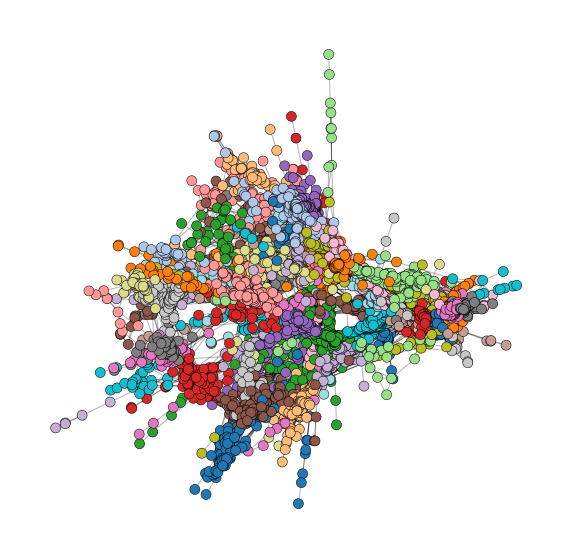

In [13]:
gauges_id = df['STAID']

G = make_backbone_network(gauges_similarity, gauges_id, alpha = alpha_gauges, reciprocated=False)

print("Catchments Network")
print("Number of nodes:", len(G.nodes()))
print("Number of edges:", len(G.edges()))

_, communities, communities_inv = make_community(G, return_inv=True)

nodes_id_giant_comp = list(sorted(nx.connected_components(G), key=len, reverse=True)[0])
G_giant = G.subgraph(list(nx.connected_components(G))[0]).copy()
communities_giant = {i:communities[i] for i in nodes_id_giant_comp}

quantities = [{"name":"communities", "values":communities, "discrete":True}]
plot_network(G_giant, quantities, nodesize=None, suffix='catchments_giant_%s' % scale, do_plot_labels=False)

gauges_to_nodes = {j:i for i,j in nx.get_node_attributes(G, "label").items()}
df["community"] = [communities[gauges_to_nodes[x]] for x in gauges_id]
community_counts_dict = df.community.value_counts().to_dict()

# Save catchments network information

In [14]:
with open("catchments_network_nodes_%s.json" % scale, "w") as outfile:
    outfile.write(json.dumps(nx.get_node_attributes(G, "label")))

with open("catchments_network_edges_%s.json" % scale, "w") as outfile:
    outfile.write(json.dumps(list(G.edges)))

df_with_nodes = df[["community", "STAID"]]
df_with_nodes["node"] = range(len(df_with_nodes))
df_with_nodes.rename(columns={"community": "class"}, inplace=True)
df_with_nodes[["node", "STAID", "class"]].to_csv("catchments_classes_%s.csv" % scale, index=False)

# Create operational variables for future use 

In [15]:
list_communities_attr = [[nx.get_node_attributes(G_V, "label")[i] for i in j] for _,j in communities_attr_to_nodes_dict.items()]
dict_attribute_cluster = {}
dict_len_attribute_cluster = {}
for i,j in enumerate(list_communities_attr):
    dict_len_attribute_cluster[i] = len(j)
    for jj in j:
        dict_attribute_cluster[jj] = i

# Plot gaging stations in map

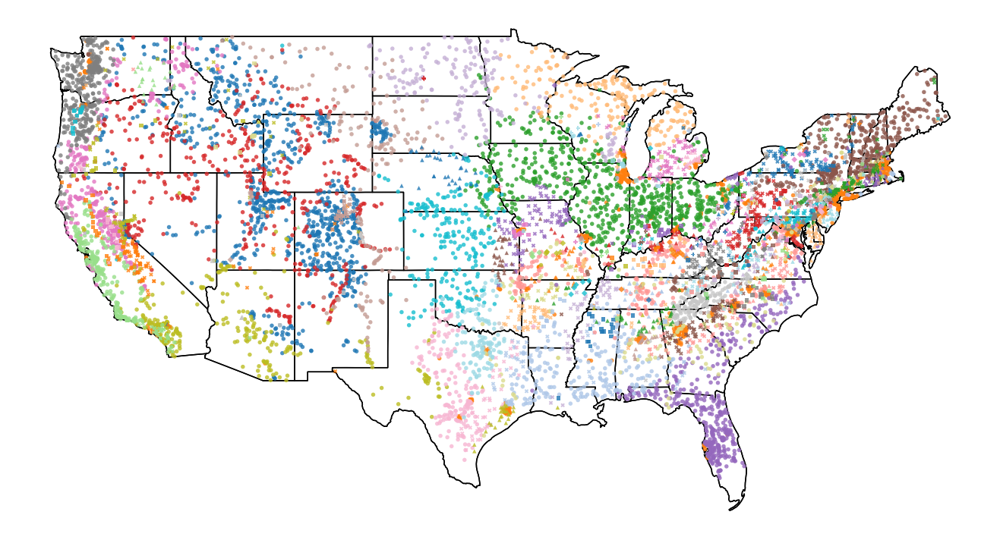

In [16]:
if scale == "CONUS":
    plot_gauges_in_map_dots(df, lat_col='LAT_GAGE', lon_col='LNG_GAGE', with_states_boundaries=True, column='community', in_conus=True, suffix=scale)

if scale == "HUC14":
    plot_gauges_in_map_dots(df, lat_col='LAT_GAGE', lon_col='LNG_GAGE', filenames=[('datasets/HUC14_shapefiles/Shape/WBDHU2.shp', "k")], with_states_boundaries=False, column='community', in_conus=False, suffix=scale)

### Plot map with certain cluster of catchments

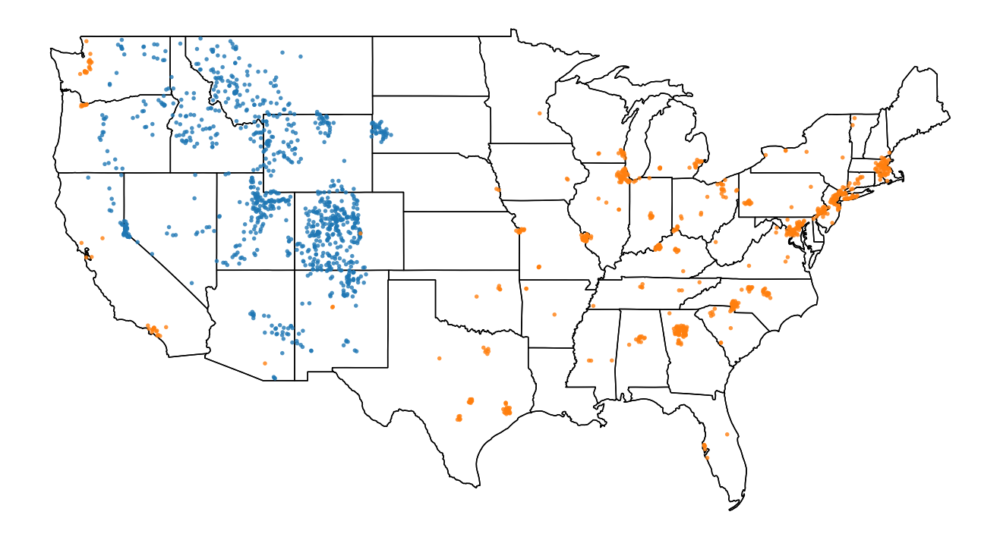

In [17]:
# Modify the list to plot different clusters
clusters_to_plot = [0,1]

if scale == "CONUS":
    plot_gauges_in_map_dots(df.loc[df['community'].isin(clusters_to_plot)].sort_values(by=["community"]), lat_col='LAT_GAGE', lon_col='LNG_GAGE', column='community', suffix=scale+"_"+"_".join(map(str, clusters_to_plot)), with_states_boundaries=True, in_conus=True)

if scale == "HUC14":
    plot_gauges_in_map_dots(df.loc[df['community'].isin(clusters_to_plot)].sort_values(by=["community"]), lat_col='LAT_GAGE', lon_col='LNG_GAGE', column='community', suffix=scale+"_"+"_".join(map(str, clusters_to_plot)), filenames=[('datasets/HUC14_shapefiles/Shape/WBDHU2.shp', "k")], with_states_boundaries=False, in_conus=False)


# Generate representative catchments

In [18]:
df_conterm_basinid = pd.read_csv("datasets/GAGESII/conterm_basinid.txt", dtype={"STAID":"str"})
df_for_network_metrics = copy(df)
df_for_network_metrics["community_size"] = [community_counts_dict[i] for i in df_for_network_metrics["community"]]
df_for_network_metrics = pd.merge(df_for_network_metrics, df_conterm_basinid[["STANAME", "STAID"]], how='inner', on = 'STAID')
representative_node_id=[]
highlighted_sites_top_degree = {}
for community_id in sorted(df_for_network_metrics[(df_for_network_metrics["community_size"]>=10)]["community"].unique())[:]:
    highlighted_sites_top_degree[community_id] = {}
    H_ = G.subgraph(df_for_network_metrics[df_for_network_metrics["community"]==community_id].index.values)
    H = nx.Graph(H_)
    nodes_by_degree = sorted(H.degree(), key=lambda item: item[1], reverse=True)
    removed_nodes = 0.
    for i in range(100):
        nodes_by_degree = sorted(H.degree(), key=lambda item: item[1], reverse=True)
        if len(nodes_by_degree)==0:break
        node_id = nodes_by_degree[0][0]
        representative_node_id.append(node_id)
        if i==0:
            max_degree = nodes_by_degree[0][1]
            overall_num_nodes = len(nodes_by_degree)
        neighbors = list(H.neighbors(node_id))
        H.remove_nodes_from(neighbors)
        H.remove_node(node_id)
        removed_nodes += 1.*len(neighbors)+1.
        highlighted_sites_top_degree[community_id].setdefault("lat", []).append(df_for_network_metrics.iloc[node_id, :]["LAT_GAGE"])
        highlighted_sites_top_degree[community_id].setdefault("lon", []).append(df_for_network_metrics.iloc[node_id, :]["LNG_GAGE"])
        highlighted_sites_top_degree[community_id].setdefault("community", []).append(df_for_network_metrics.iloc[node_id, :]["community"])
        highlighted_sites_top_degree[community_id].setdefault("name", []).append(df_for_network_metrics.iloc[node_id, :]["STANAME"])
        highlighted_sites_top_degree[community_id]["color"] = 'k'
        
        if removed_nodes/overall_num_nodes>=0.95:
            break

# Plot representative catchments

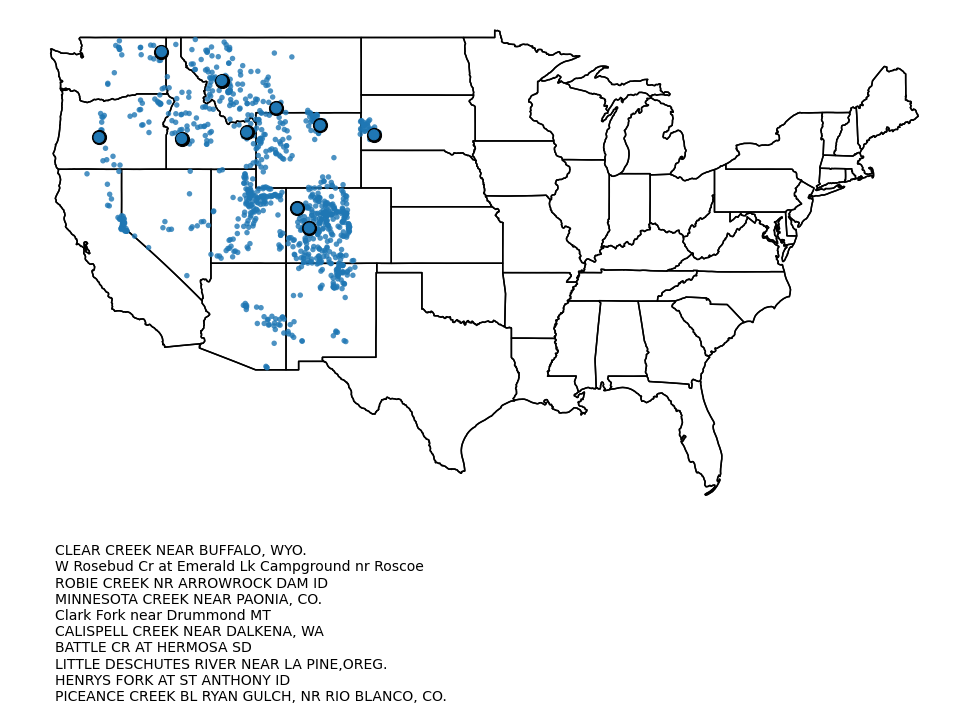

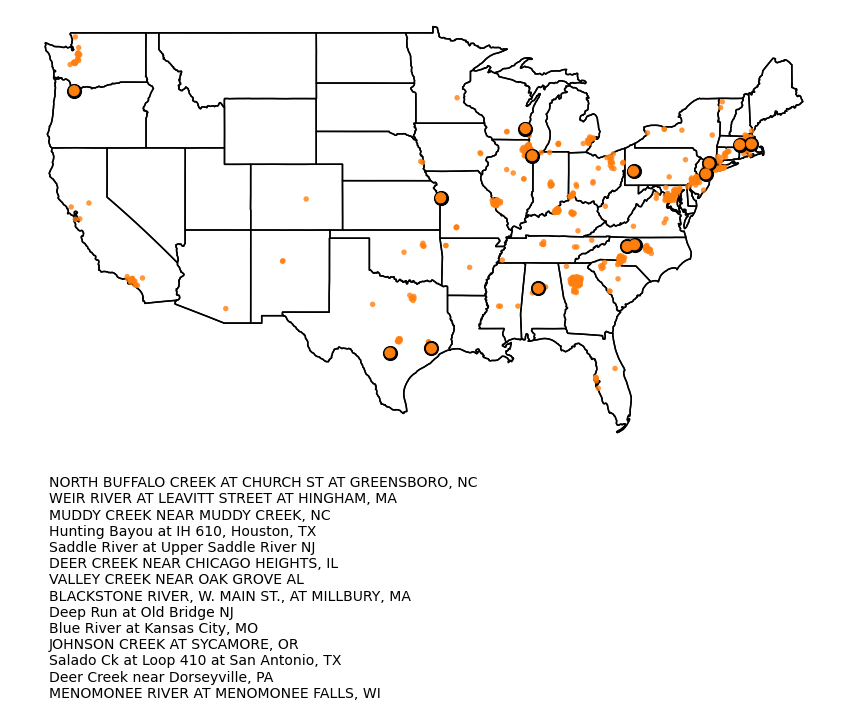

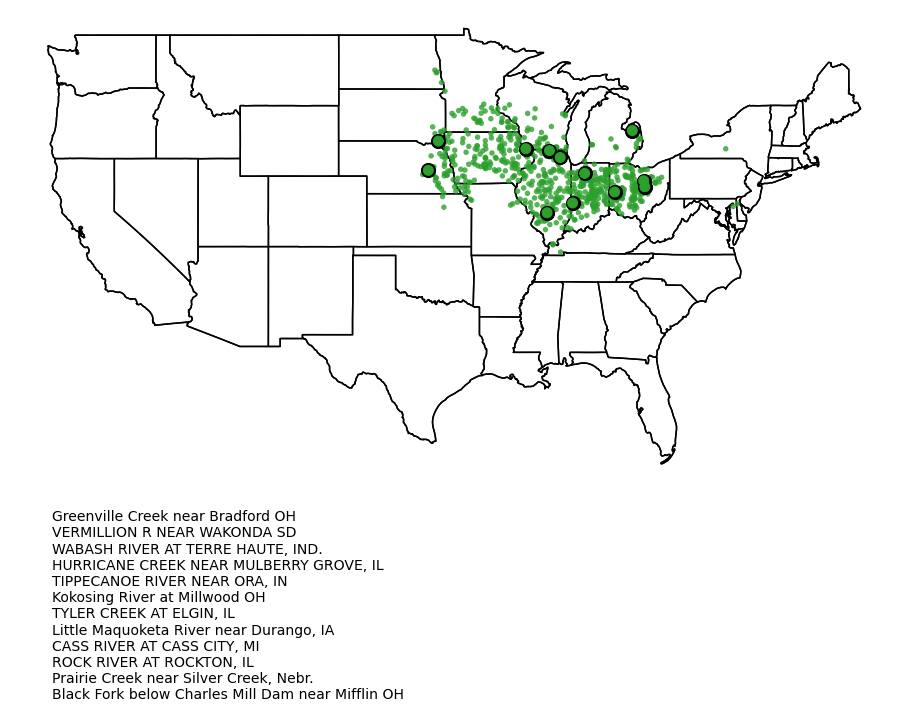

In [19]:
# Modify the list to plot different clusters
clusters_to_plot = [0,1,2]

if scale == "CONUS":
    for i in clusters_to_plot:
        plot_gauges_in_map_dots(df.loc[df['community']==i], lat_col='LAT_GAGE', lon_col='LNG_GAGE', column='community', highlighted_sites=highlighted_sites_top_degree[i], suffix=scale+"_"+str(i)+"_with_representatives", with_states_boundaries=True)

if scale == "HUC14":
    for i in clusters_to_plot:
        plot_gauges_in_map_dots(df.loc[df['community']==i], lat_col='LAT_GAGE', lon_col='LNG_GAGE', column='community', highlighted_sites=highlighted_sites_top_degree[i], suffix=scale+"_"+str(i)+"_with_representatives", filenames=[('datasets/HUC14_shapefiles/Shape/WBDHU2.shp', "k")], with_states_boundaries=False, in_conus=False)


# Generate spatial coherence measure (CONUS only)

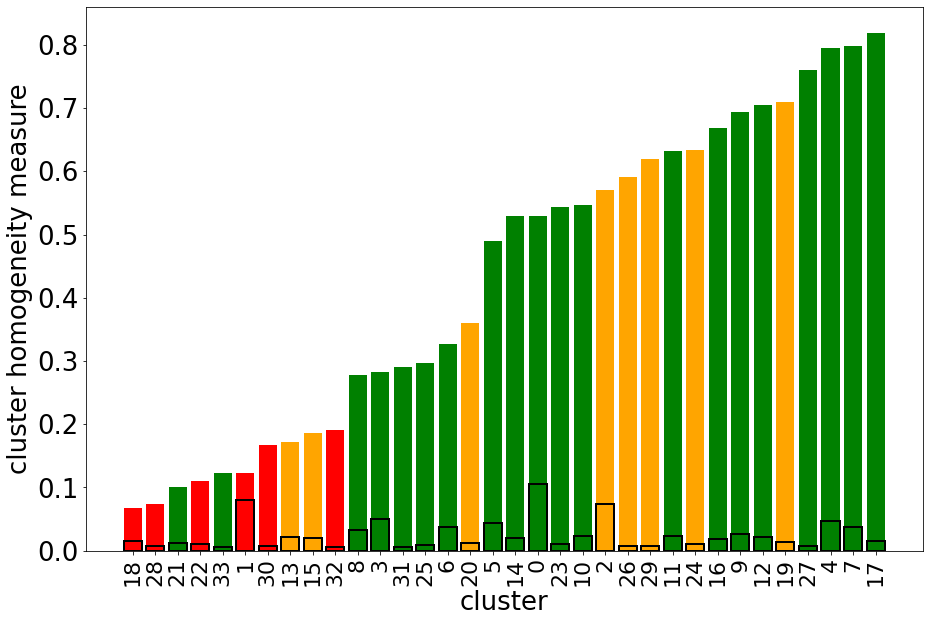

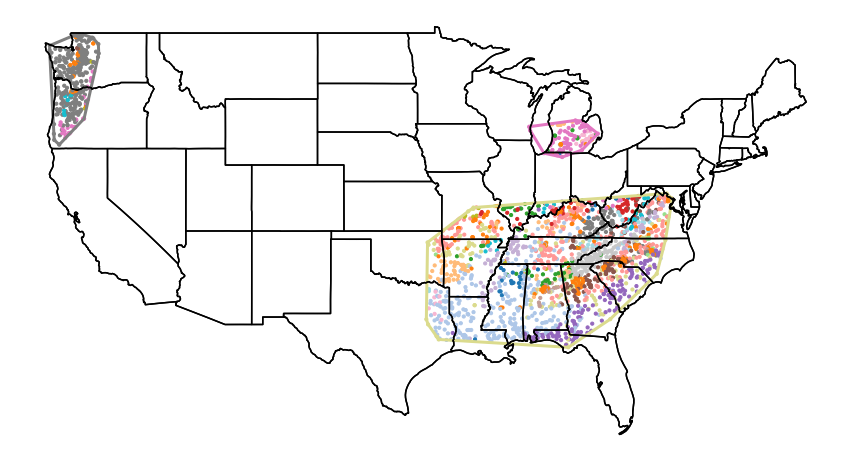

In [20]:
assert(scale=="CONUS")

gdf = gpd.GeoDataFrame(df[["STAID", "LAT_GAGE", "LNG_GAGE", "community"]], geometry=gpd.points_from_xy(df.LNG_GAGE, df.LAT_GAGE))

gdf_top_clusters, homog_random_distr, real_homog = make_spatial_analysis(gdf)
plot_homogeneity_by_cluster(gdf, gdf_top_clusters)
plot_exemplar_hulls(gdf, gdf_top_clusters, communities_to_plot=[7,18,26])

# Generate and plot traits anomalies in barchart 

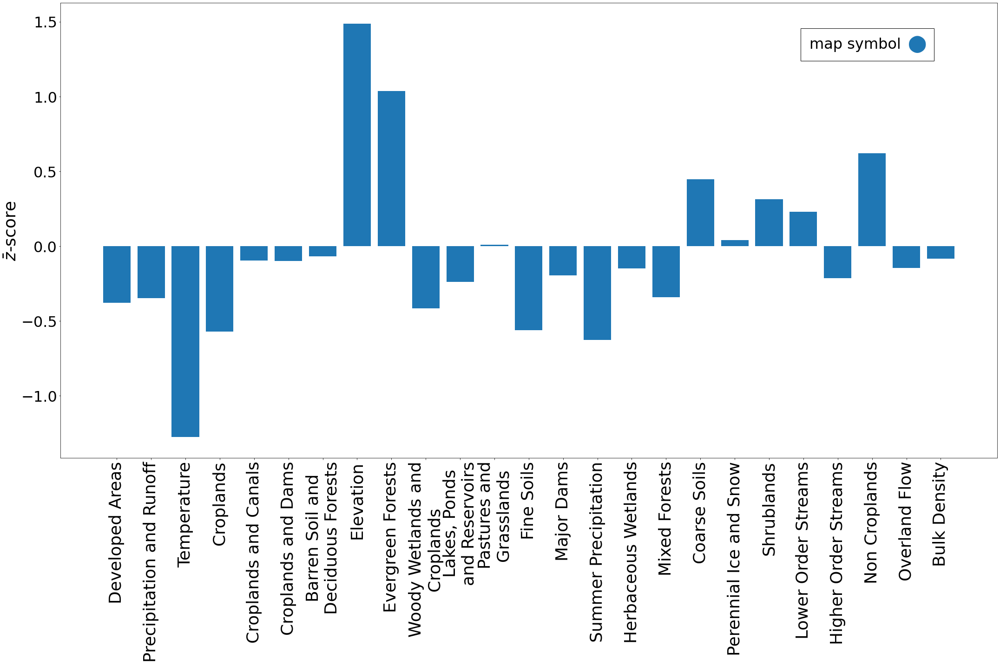

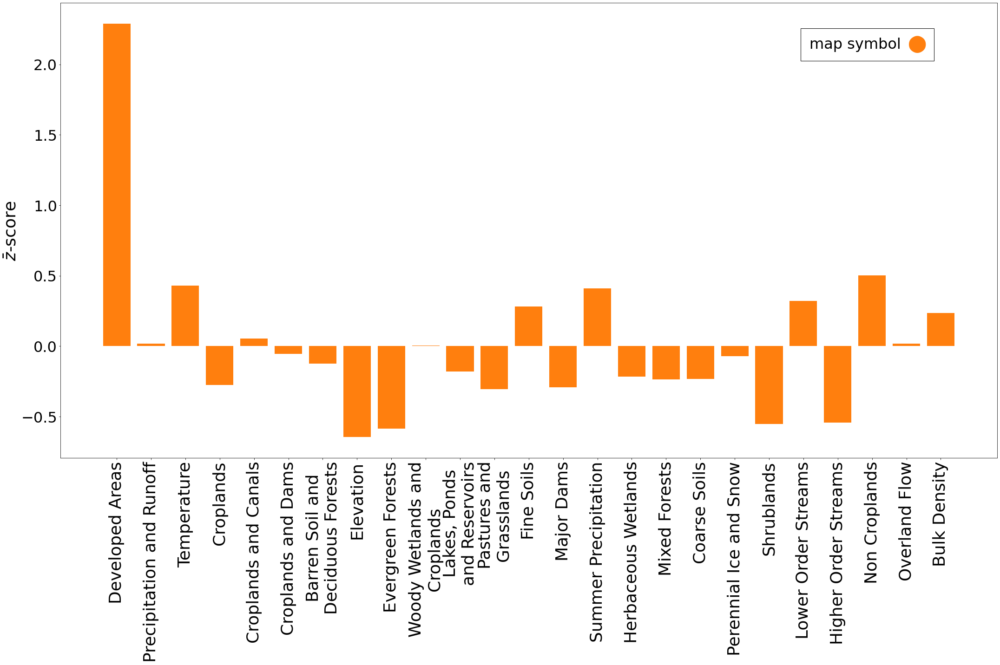

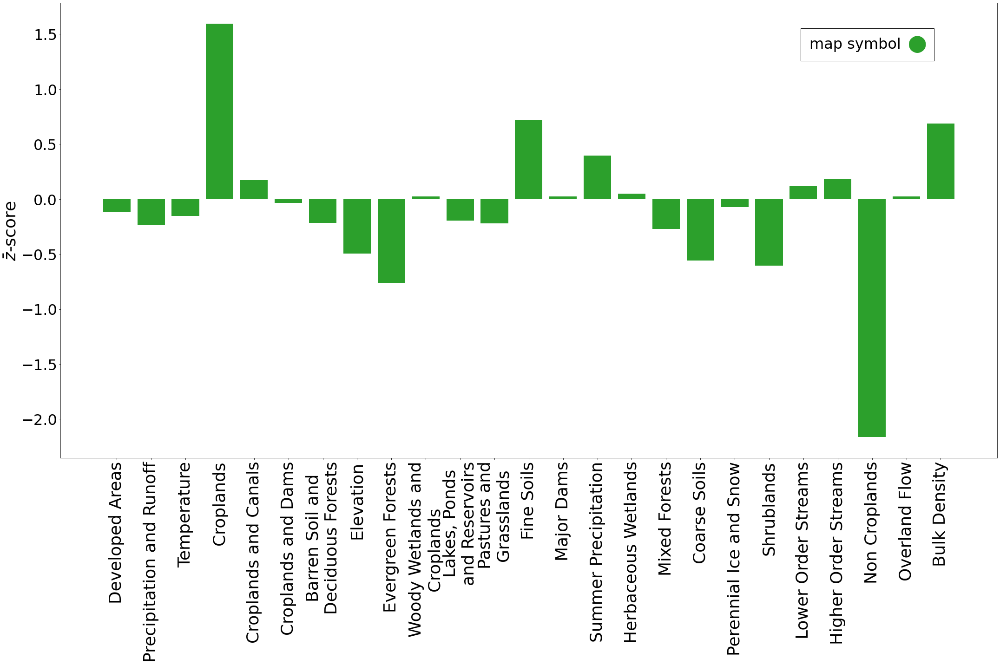

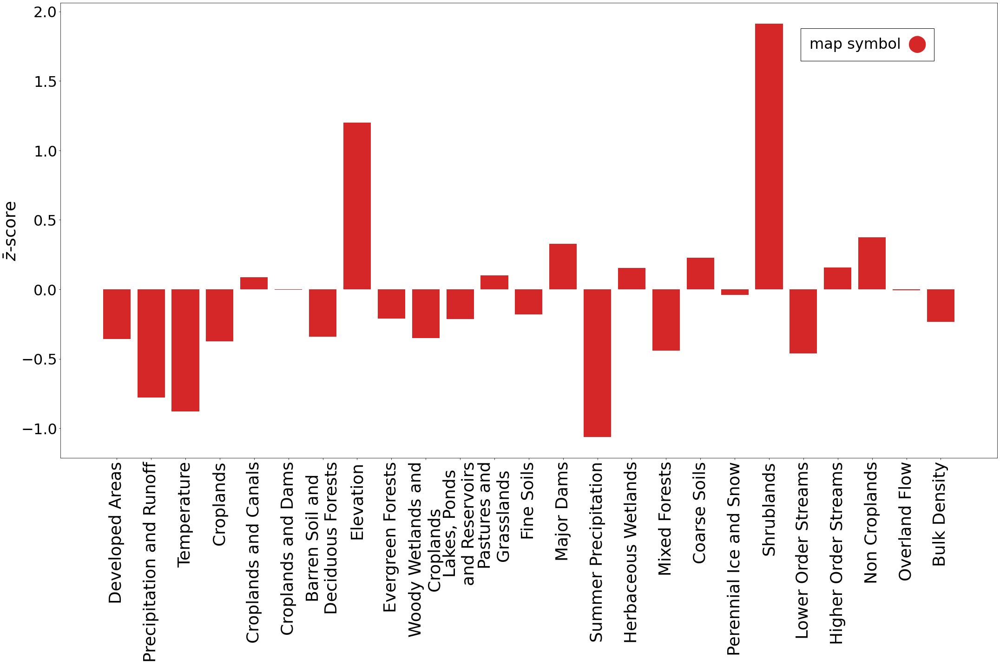

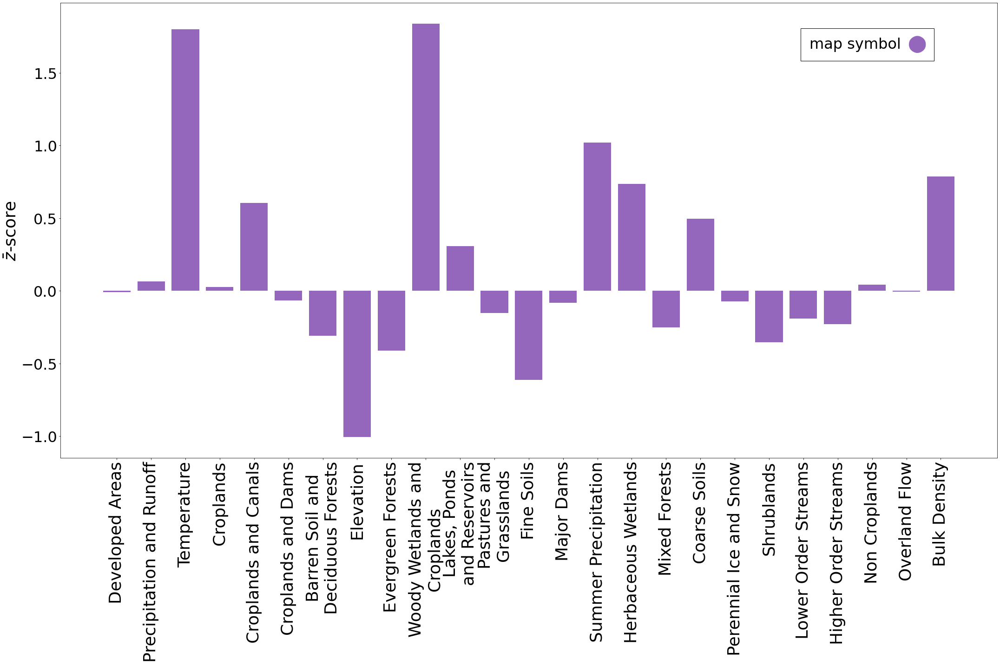

...

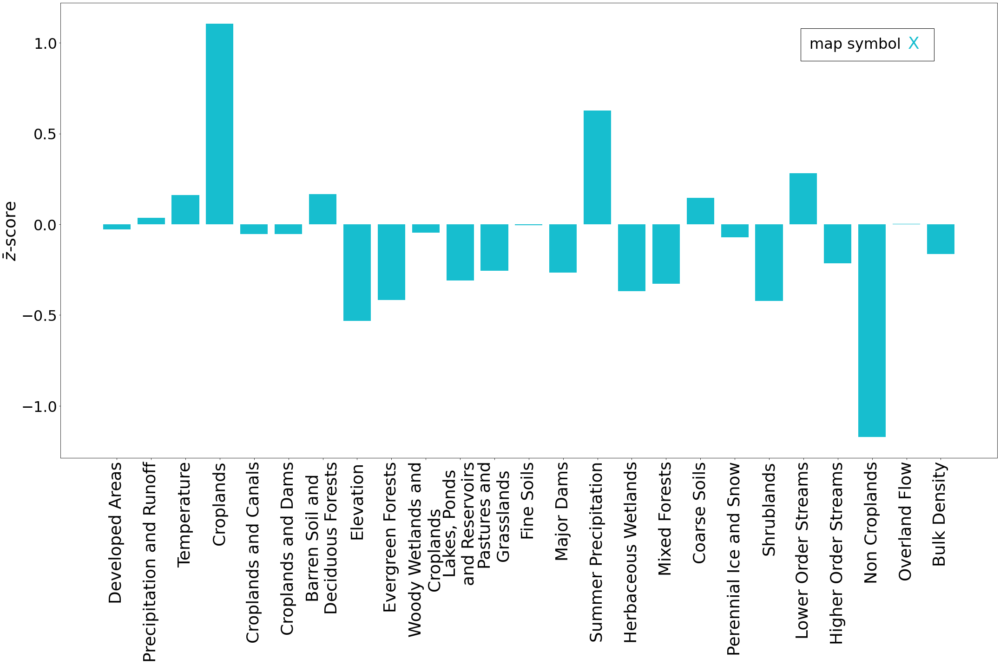

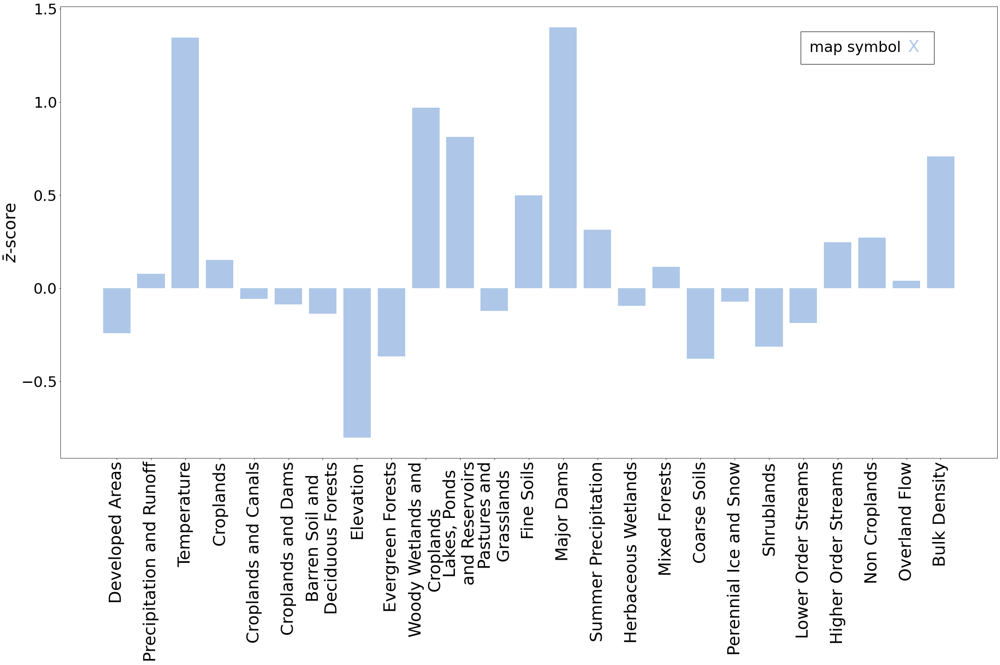

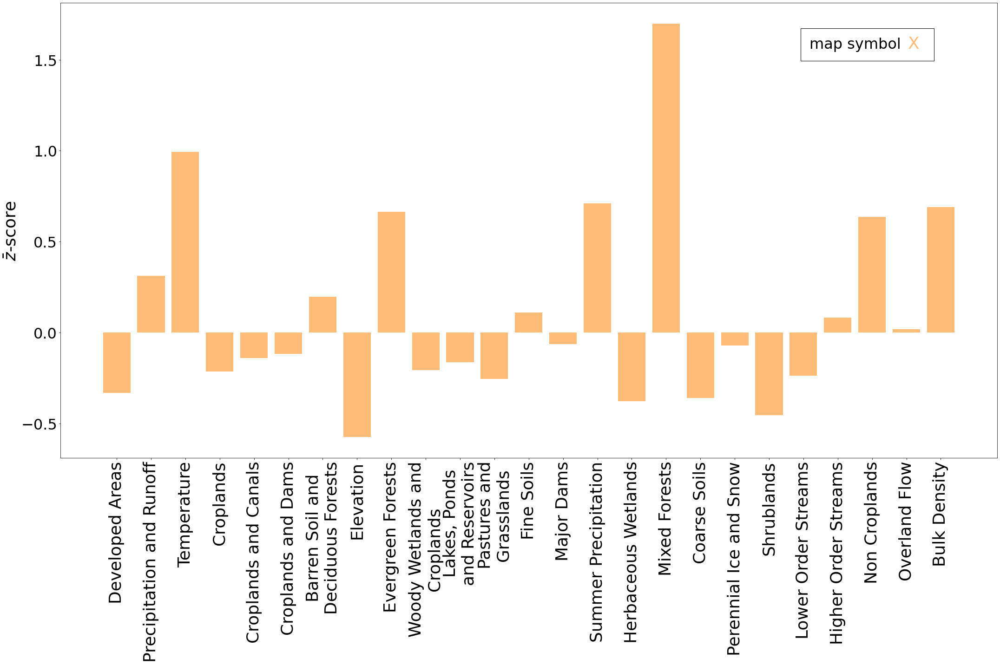

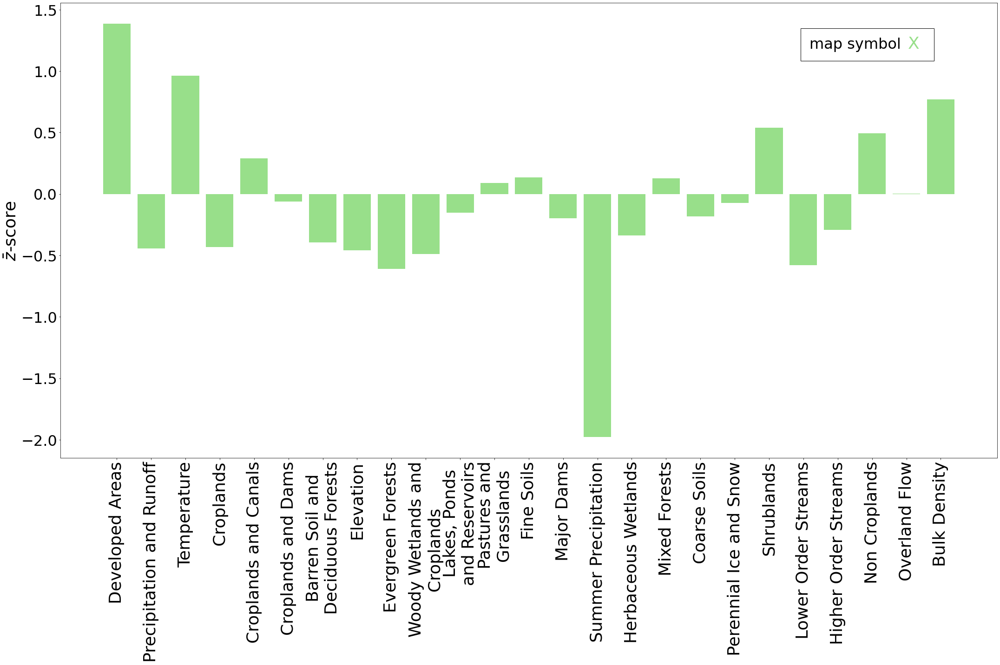

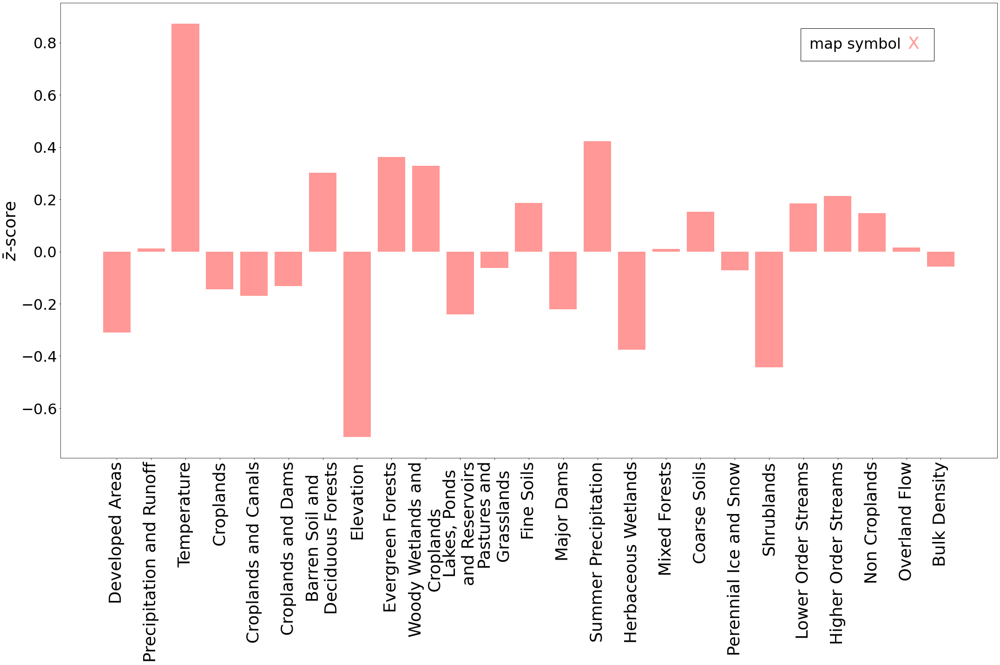

In [21]:
df_community_anomalies = make_df_community_anomalies(df[[x for x in df.columns.values if x not in NOT_FOR_SIM]])

if scale == "CONUS":
    min_size_cluster_to_plot = 50

if scale == "HUC14":
    min_size_cluster_to_plot = 10

df_anomalies_agg_ = plot_anomalies_agg(df_community_anomalies.loc[df["community"].value_counts().index.values,:],
                   traits_categories_labels, dict_attribute_cluster, dict_len_attribute_cluster, community_counts_dict, min_community_size=min_size_cluster_to_plot, suffix=scale)

# Save traits categories zscores

In [22]:
df_anomalies_agg_.insert(0, "community", df_community_anomalies.index.values[:len(df_anomalies_agg_)])
df_anomalies_agg_.to_csv("traits_categories_zscores_per_catchment_class_%s.csv" % scale, index=False)

# Plot anomalies in network of traits

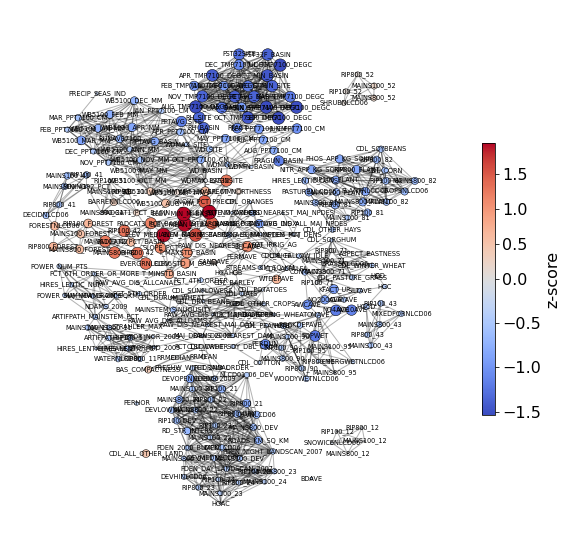

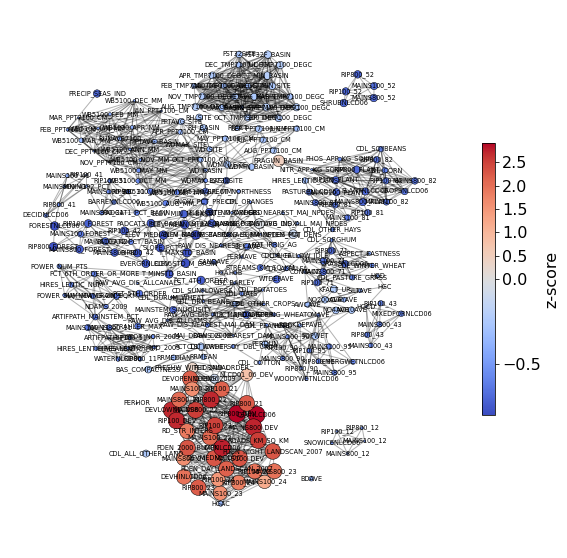

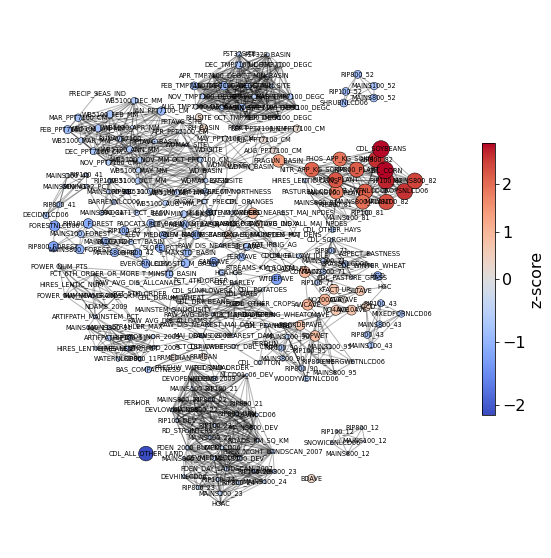

In [23]:
# Modify the list to plot different clusters
clusters_to_plot = [0,1,2]

for community in clusters_to_plot:
    plot_network(G_V,
        [{"name":"z-score", "values":dict(enumerate(df_community_anomalies.loc[community, :].values)), "discrete":False}],
        suffix='anomalies_%d_cluster_%s'%(community, scale),
        bicolor=True, nodesize=dict(enumerate(np.abs(df_community_anomalies.loc[community, :].values))), label_size=6.5)

# Plot traits anomalies differences between two catchment clusters

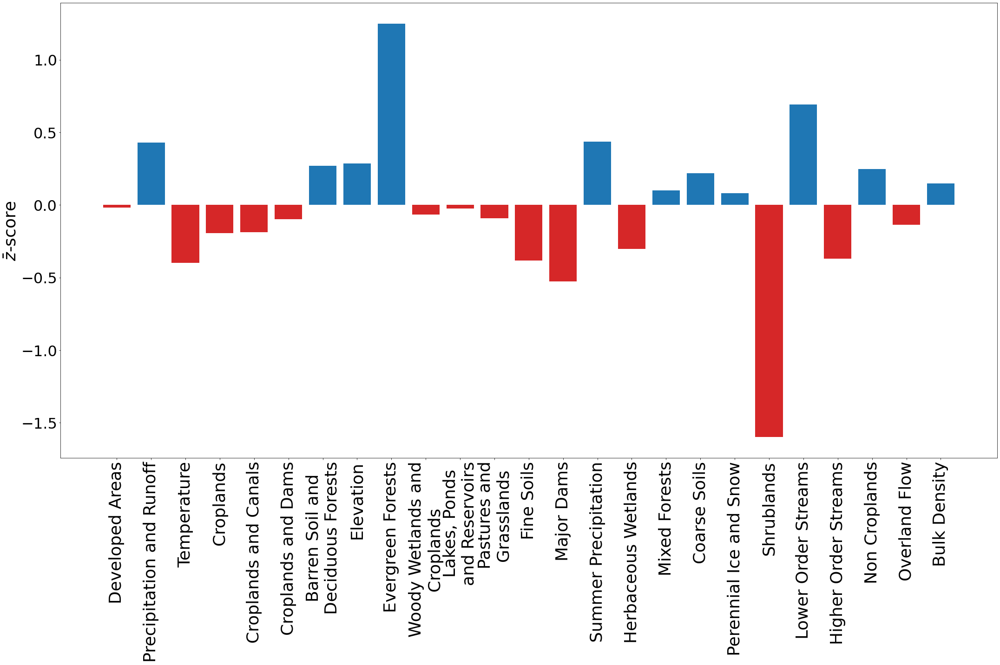

In [24]:
# Modify this list to plot the difference barchart
# The list must include only two elements
clusters_for_difference = [0,3]
assert(len(clusters_for_difference)==2)

plot_anomalies_agg_diff(df_community_anomalies.loc[df["community"].value_counts().index.values,:],
                   traits_categories_labels, clusters_for_difference, dict_attribute_cluster, dict_len_attribute_cluster, community_counts_dict, min_community_size=0, suffix=scale)

# Load and plot hydrological indices aggregated by catchment clusters

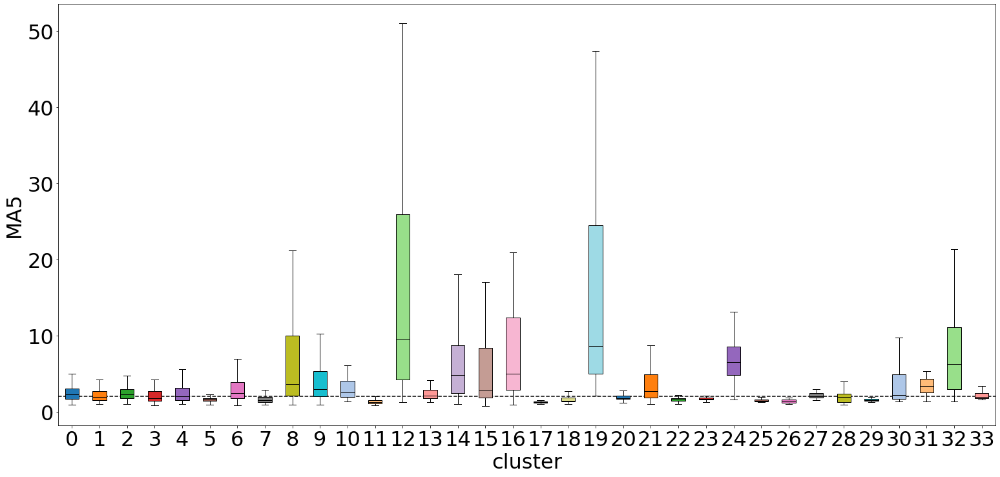

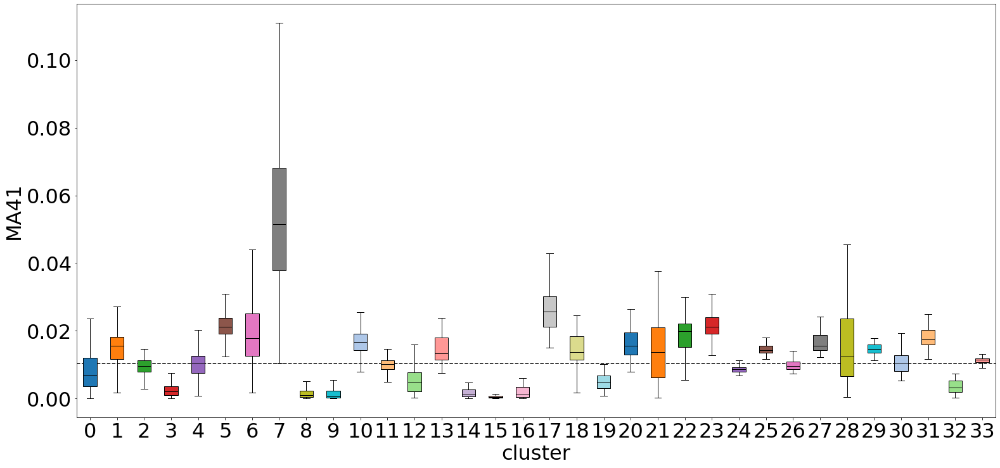

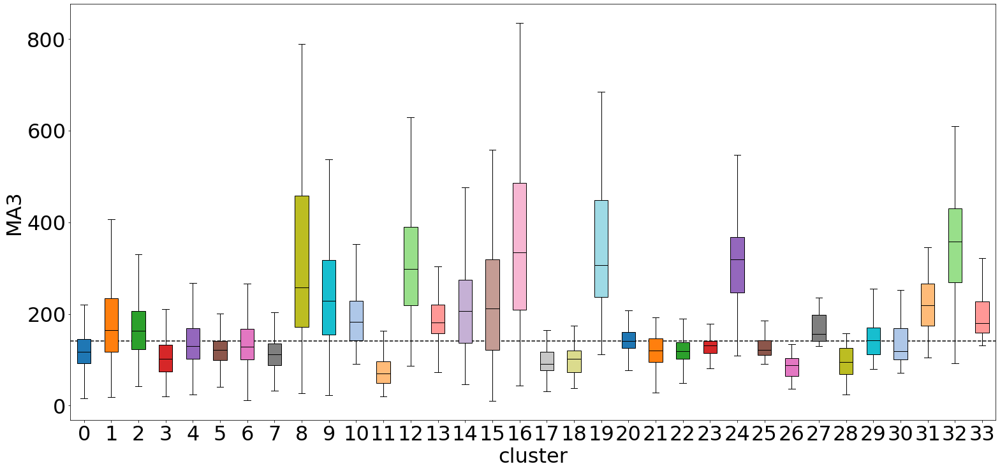

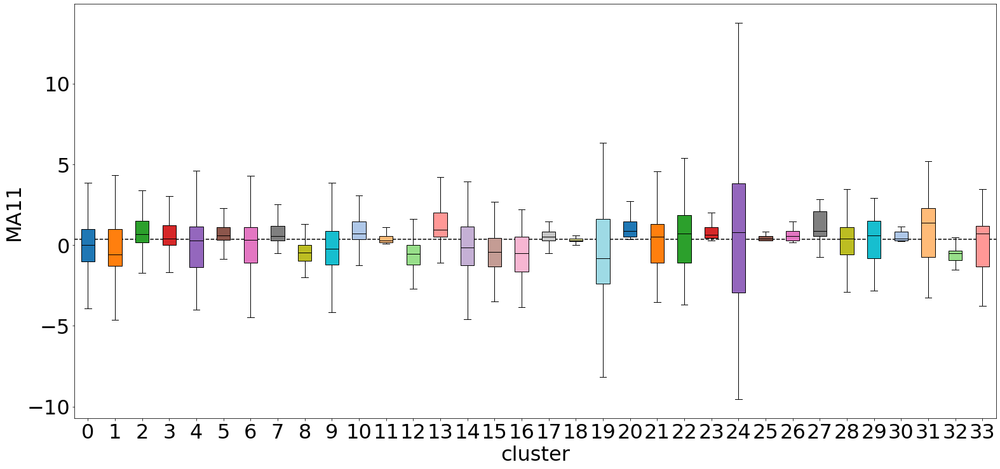

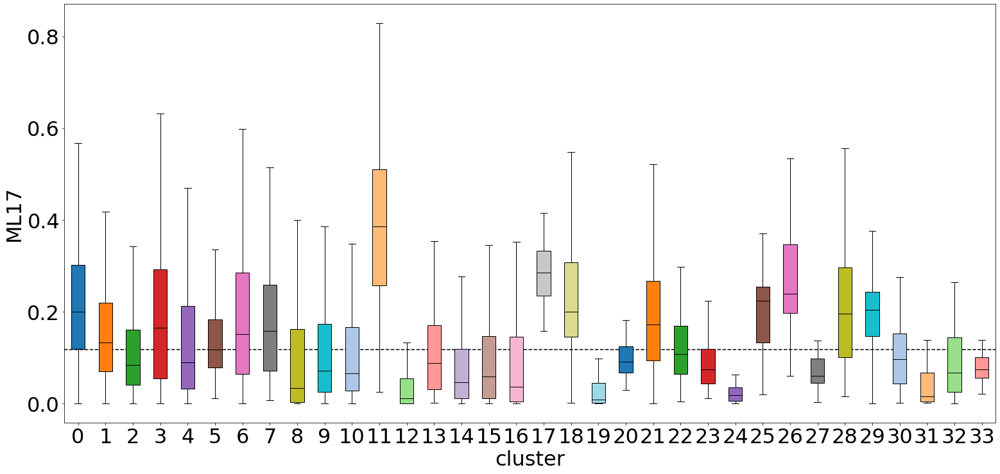

...

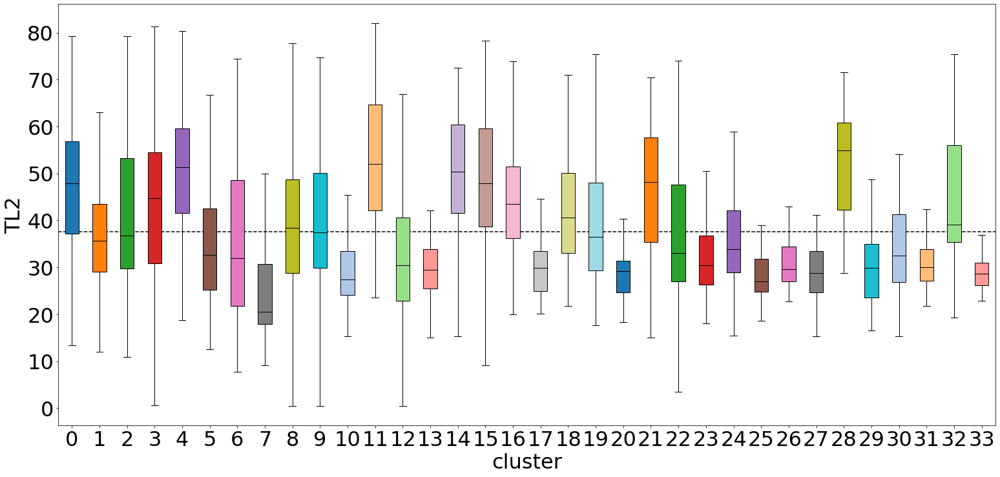

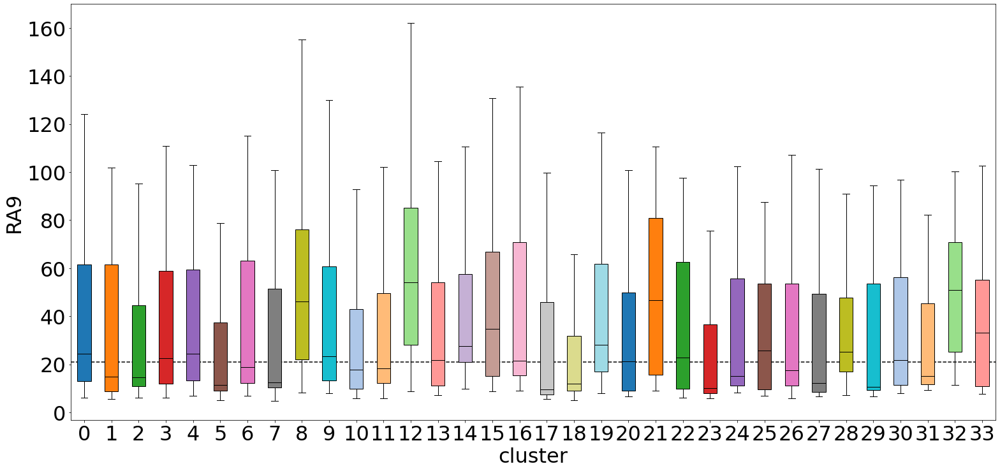

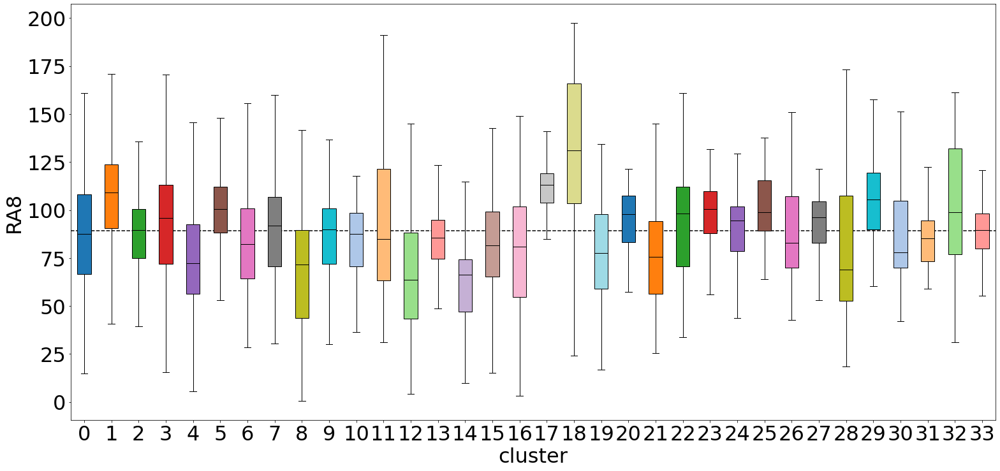

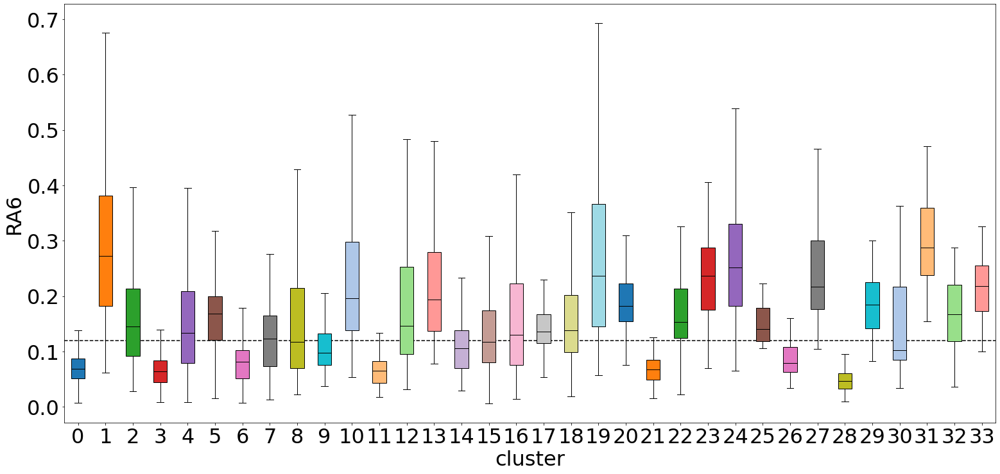

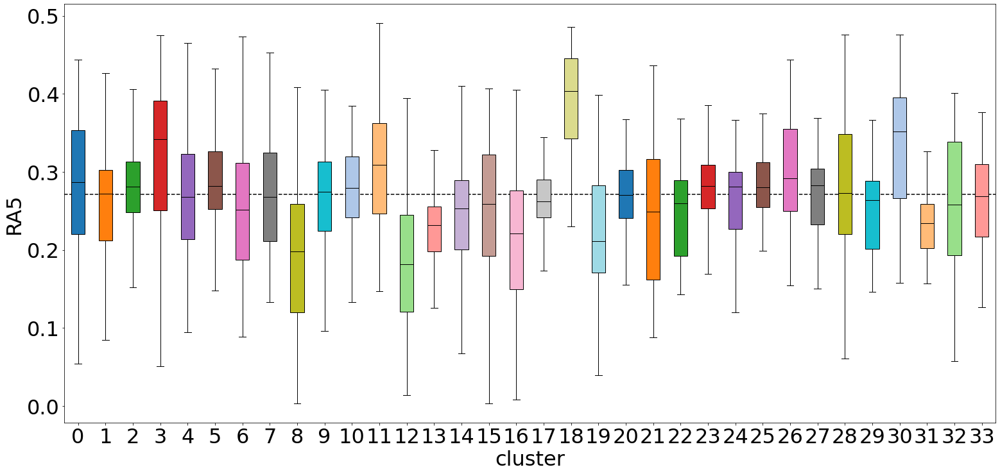

In [25]:
df_WQ = pd.read_csv("datasets/RDC_hydrological_signatures_1971_2000_olden.csv", sep=",", encoding = "utf-8", encoding_errors='replace', dtype={"STAID":"str"})
df_WQ.replace([np.inf, -np.inf], np.nan,inplace=True)
WQ_columns = [x for x in list(df_WQ.columns) if x != "STAID"]
df_traits_WQ = pd.merge(df, df_WQ, on="STAID")
df_WQ = df_traits_WQ[['STAID', 'community']+[x for x in list(df_WQ.columns) if x != "STAID"]]
df_WQ["community_size"] = pd.Series([community_counts_dict[x] for x in df_WQ["community"].values])

# Modify this number to include more or less cluster in the boxplots
if scale == "CONUS":
    min_size_cluster_to_plot = 50

if scale == "HUC14":
    min_size_cluster_to_plot = 10

plot_WQ(df_WQ[df_WQ["community_size"]>=min_size_cluster_to_plot], suffix=scale)

# Comparison with Hierarchical clustering and K-means

## Generate median most similar clusters for network workflow (CONUS only)

In [26]:
assert(scale=="CONUS")

num_cluster_to_95 = np.sum((np.cumsum(df.community.value_counts().tolist())/len(df))<0.95)+1
print("Number clusters to cover at least 95% of data (network):", num_cluster_to_95)

community_similarities_network = make_cosine_similarity(df_community_anomalies.iloc[:num_cluster_to_95,:].values, between_0_1=False)
print("Median of most similar clusters (network):", np.median(community_similarities_network.max(axis=1)))

Number clusters to cover at least 95% of data (network): 71
Median of most similar clusters (network): 0.7219816041924794


## Generate median most similar clusters for Hierarchical clustering workflow (CONUS only)

Number clusters to cover at least 95% of data (hierarchical clustering): 71
Median of most similar clusters (kmeans): 0.7946454324092042


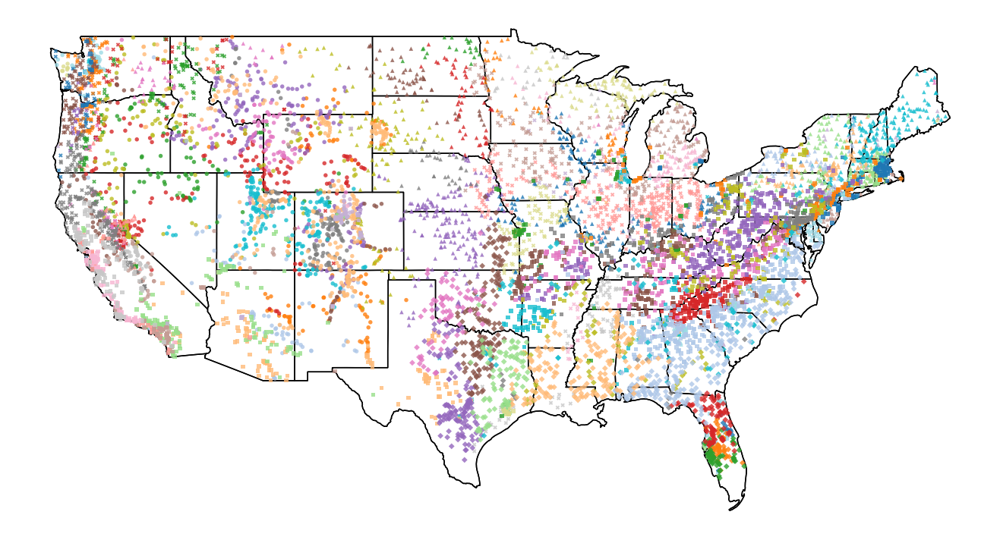

In [27]:
assert(scale=="CONUS")

Z = linkage(M_transf, method='ward', metric='euclidean')

df_ward = copy(df)
df_ward["community"] = fcluster(Z, t=56, criterion='distance')
num_cluster_to_95_ward = np.sum((np.cumsum(df_ward.community.value_counts().tolist())/len(df_ward))<0.95)+1
print("Number clusters to cover at least 95% of data (hierarchical clustering):", num_cluster_to_95_ward)

df_community_anomalies_ward = make_df_community_anomalies(df_ward[[x for x in df_ward.columns.values if x not in NOT_FOR_SIM]])
community_similarities_ward = make_cosine_similarity(df_community_anomalies_ward.iloc[:num_cluster_to_95_ward,:].values, between_0_1=False)
print("Median of most similar clusters (kmeans):", np.median(community_similarities_ward.max(axis=1)))

plot_gauges_in_map_dots(df_ward, lat_col='LAT_GAGE', lon_col='LNG_GAGE', column='community', suffix='hierclus', in_conus=True, with_states_boundaries=True)

## Generate median most similar clusters for Kmeans workflow (CONUS only)

Number clusters to cover at least 95% of data (kmeans): 70
Median of most similar clusters (kmeans): 0.8318782603172474


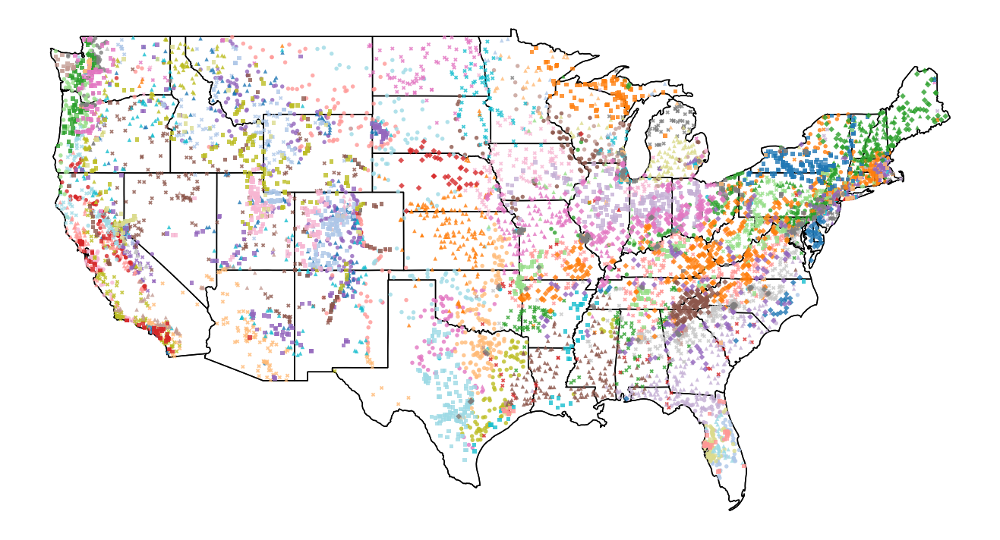

In [28]:
assert(scale=="CONUS")

kmeans = KMeans(n_clusters=88, random_state=42).fit(M_transf)

df_kmeans = copy(df)
df_kmeans["community"] = kmeans.labels_
num_cluster_to_95_kmeans = np.sum((np.cumsum(df_kmeans.community.value_counts().tolist())/len(df_kmeans))<0.95)+1
print("Number clusters to cover at least 95% of data (kmeans):", num_cluster_to_95_kmeans)

df_community_anomalies_kmeans = make_df_community_anomalies(df_kmeans[[x for x in df_kmeans.columns.values if x not in NOT_FOR_SIM]])
community_similarities_kmeans = make_cosine_similarity(df_community_anomalies_kmeans.iloc[:num_cluster_to_95_kmeans,:].values, between_0_1=False)
print("Median of most similar clusters (kmeans):", np.median(community_similarities_kmeans.max(axis=1)))

plot_gauges_in_map_dots(df_kmeans, lat_col='LAT_GAGE', lon_col='LNG_GAGE', column='community', suffix='kmeans', in_conus=True, with_states_boundaries=True)